In [1]:
import pandas as pd
from pandas_profiling import ProfileReport
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv("final_clean_df.csv", index_col=0)

In [3]:
df

,Genre,Title,Artist,Explicit,Length,Scale,Key,BPM,Danceability,Positiveness,Liveness,Energy,speechness,KeyScaled,Lyrics,Not_Formatted_Lyrics
0,rock,into the storm,Gojira,False,5.02,D,Major,106,25,11,13,97,7,D,go say something about awakening the rebellion...,Go\r\n\r\nSay something about awakening\r\nThe...
1,rock,the sound of silence,Disturbed,False,4.08,F#,Minor,86,32,18,10,28,3,F#m,hello darkness my old friend i've come to talk...,"Hello darkness, my old friend\r\nI've come to ..."
2,rock,amazonia,Gojira,False,5.00,A,Major,182,38,51,24,95,4,A,incite a riot put yourself in a trance you rot...,"Incite a riot, put yourself in a trance\r\nYou..."
3,rock,back in black,AC/DC,False,4.15,A,Major,188,31,76,8,70,5,A,back in black i hit the sack i've been too lon...,"Back in black, I hit the sack\r\nI've been too..."
4,rock,another world,Gojira,False,4.24,G,Minor,170,35,24,12,88,4,Gm,we mock and slaughter all the purest kinds bli...,We mock and slaughter all the purest kinds\r\n...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11394,hiphop,higher learning,Young Jeezy,True,3.44,G#,Minor,77,71,90,11,65,25,G#m,i need some weed man somebody call the weed ma...,I need some weed man\r\nSomebody call the weed...
11395,hiphop,its goin down,Celly Cel,False,5.24,F#,Minor,75,82,78,4,50,23,F#m,it's goin' down tonight you know i gots to go ...,"It's goin' down tonight, you know I gots to go..."
11398,hiphop,let me know,Cam'Ron,True,4.14,F#,Major,92,75,69,35,79,33,F#,all my harlem niggas my bk niggas back uptown ...,All my harlem niggas my BK niggas\r\nBack upto...
11401,hiphop,beta,Tyson James,False,3.54,G,Major,89,73,58,28,57,45,G,verse topher oh boy catch me walking through ...,Verse 1 (Topher):\r\nOh boy\r\nCatch me walkin...


d:\idan\python\genre_prediction_data_science\venv\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Genre', ylabel='count'>

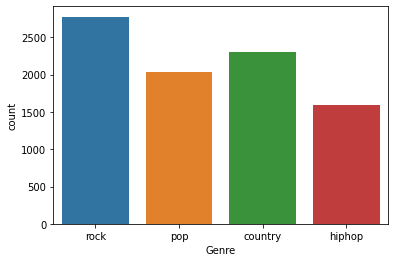

In [4]:
sns.countplot(df['Genre'])

In [5]:
profile_df = ProfileReport(df, title='Pandas Profiling Report')
profile_df

Summarize dataset:   0%|          | 0/30 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
import nltk, spacy
from nltk.corpus import stopwords

nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\idan9\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\idan9\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [7]:
import re,pickle
customStopWords = ["could","right","find","give","gon","never","time","baby","need",
                   "way","love","feel", "would", "want", "cause", "want", "well", "think", "tell", "take",
                   "come", "yeah", "see", 'make', "get", "go", "one", "say", "let", "i'm", "im", "'s", "n't", "'m",
                   "'re", "'ll", "'ve", "...",
                   "ä±", "''", '``',
                   '--', ',', "'d", 'el', 'chorus', 'know', 'verse', 'oh', 'la', 'ya', 'na', 'wo', 'wan',
                   'Chorus', 'Verse',
                   'ca', 'cuz', '[Verse 1:]', 'got', '[Intro:]', '[Chorus]', '\n', 's', 't', 'n', 'don',
                   'ya', 'aah', 'ye', 'ba', 'da', 'buh', "like", 'duh', 'doo', 'oh', 'ooh', 'woo', 'uh', 'hoo', 'ah',
                   'oo', 'la', 'chorus', 'beep', 'ha', "get'", "like'"]
stpwrd=['x', 'y', 'your', 'yours', 'yourself', 'yourselves', 'you', 'yond', 'yonder', 'yon', 'ye', 'yet', 'z', 'zillion', 'j', 'u', 'umpteen', 'usually', 'us', 'username', 'uponed', 'upons', 'uponing', 'upon', 'ups', 'upping', 'upped', 'up', 'unto', 'until', 'unless', 'unlike', 'unliker', 'unlikest', 'under', 'underneath', 'use', 'used', 'usedest', 'r', 'rath', 'rather', 'rathest', 'rathe', 're', 'relate', 'related', 'relatively', 'regarding', 'really', 'res', 'respecting', 'respectively', 'q', 'quite', 'que', 'qua', 'n', 'neither', 'neaths', 'neath', 'nethe', 'nethermost', 'necessary', 'necessariest', 'necessarier', 'never', 'nevertheless', 'nigh', 'nighest', 'nigher', 'nine', 'noone', 'nobody', 'nobodies', 'nowhere', 'nowheres', 'no', 'noes', 'nor', 'nos', 'no-one', 'none', 'not', 'notwithstanding', 'nothings', 'nothing', 'nathless', 'natheless', 't', 'ten', 'tills', 'till', 'tilled', 'tilling', 'to', 'towards', 'toward', 'towardest', 'towarder', 'together', 'too', 'thy', 'thyself', 'thus', 'than', 'that', 'those', 'thou', 'though', 'thous', 'thouses', 'thoroughest', 'thorougher', 'thorough', 'thoroughly', 'thru', 'thruer', 'thruest', 'thro', 'through', 'throughout', 'throughest', 'througher', 'thine', 'this', 'thises', 'they', 'thee', 'the', 'then', 'thence', 'thenest', 'thener', 'them', 'themselves', 'these', 'therer', 'there', 'thereby', 'therest', 'thereafter', 'therein', 'thereupon', 'therefore', 'their', 'theirs', 'thing', 'things', 'three', 'two', 'o', 'oh', 'owt', 'owning', 'owned', 'own', 'owns', 'others', 'other', 'otherwise', 'otherwisest', 'otherwiser', 'of', 'often', 'oftener', 'oftenest', 'off', 'offs', 'offest', 'one', 'ought', 'oughts', 'our', 'ours', 'ourselves', 'ourself', 'out', 'outest', 'outed', 'outwith', 'outs', 'outside', 'over', 'overallest', 'overaller', 'overalls', 'overall', 'overs', 'or', 'orer', 'orest', 'on', 'oneself', 'onest', 'ons', 'onto', 'a', 'atween', 'at', 'athwart', 'atop', 'afore', 'afterward', 'afterwards', 'after', 'afterest', 'afterer', 'ain', 'an', 'any', 'anything', 'anybody', 'anyone', 'anyhow', 'anywhere', 'anent', 'anear', 'and', 'andor', 'another', 'around', 'ares', 'are', 'aest', 'aer', 'against', 'again', 'accordingly', 'abaft', 'abafter', 'abaftest', 'abovest', 'above', 'abover', 'abouter', 'aboutest', 'about', 'aid', 'amidst', 'amid', 'among', 'amongst', 'apartest', 'aparter', 'apart', 'appeared', 'appears', 'appear', 'appearing', 'appropriating', 'appropriate', 'appropriatest', 'appropriates', 'appropriater', 'appropriated', 'already', 'always', 'also', 'along', 'alongside', 'although', 'almost', 'all', 'allest', 'aller', 'allyou', 'alls', 'albeit', 'awfully', 'as', 'aside', 'asides', 'aslant', 'ases', 'astrider', 'astride', 'astridest', 'astraddlest', 'astraddler', 'astraddle', 'availablest', 'availabler', 'available', 'aughts', 'aught', 'vs', 'v', 'variousest', 'variouser', 'various', 'via', 'vis-a-vis', 'vis-a-viser', 'vis-a-visest', 'viz', 'very', 'veriest', 'verier', 'versus', 'k', 'g', 'go', 'gone', 'good', 'got', 'gotta', 'gotten', 'get', 'gets', 'getting', 'b', 'by', 'byandby', 'by-and-by', 'bist', 'both', 'but', 'buts', 'be', 'beyond', 'because', 'became', 'becomes', 'become', 'becoming', 'becomings', 'becominger', 'becomingest', 'behind', 'behinds', 'before', 'beforehand', 'beforehandest', 'beforehander', 'bettered', 'betters', 'better', 'bettering', 'betwixt', 'between', 'beneath', 'been', 'below', 'besides', 'beside', 'm', 'my', 'myself', 'mucher', 'muchest', 'much', 'must', 'musts', 'musths', 'musth', 'main', 'make', 'mayest', 'many', 'mauger', 'maugre', 'me', 'meanwhiles', 'meanwhile', 'mostly', 'most', 'moreover', 'more', 'might', 'mights', 'midst', 'midsts', 'h', 'huh', 'humph', 'he', 'hers', 'herself', 'her', 'hereby', 'herein', 'hereafters', 'hereafter', 'hereupon', 'hence', 'hadst', 'had', 'having', 'haves', 'have', 'has', 'hast', 'hardly', 'hae', 'hath', 'him', 'himself', 'hither', 'hitherest', 'hitherer', 'his', 'how-do-you-do', 'however', 'how', 'howbeit', 'howdoyoudo', 'hoos', 'hoo', 'w', 'woulded', 'woulding', 'would', 'woulds', 'was', 'want', 'wast', 'we', 'wert', 'were', 'with', 'withal', 'without', 'within', 'why', 'what', 'whatever', 'whateverer', 'whateverest', 'whatsoeverer', 'whatsoeverest', 'whatsoever', 'whence', 'whencesoever', 'whenever', 'whensoever', 'when', 'whenas', 'whether', 'wheen', 'whereto', 'whereupon', 'wherever', 'whereon', 'whereof', 'where', 'whereby', 'wherewithal', 'wherewith', 'whereinto', 'wherein', 'whereafter', 'whereas', 'wheresoever', 'wherefrom', 'which', 'whichever', 'whichsoever', 'whilst', 'while', 'whiles', 'whithersoever', 'whither', 'whoever', 'whosoever', 'whoso', 'whose', 'whomever', 's', 'syne', 'syn', 'shalling', 'shall', 'shalled', 'shalls', 'shoulding', 'should', 'shoulded', 'shoulds', 'she', 'sayyid', 'sayid', 'said', 'saider', 'saidest', 'same', 'samest', 'sames', 'samer', 'saved', 'sans', 'sanses', 'sanserifs', 'sanserif', 'so', 'soer', 'soest', 'sobeit', 'someone', 'somebody', 'somehow', 'some', 'somewhere', 'somewhat', 'something', 'sometimest', 'sometimes', 'sometimer', 'sometime', 'several', 'severaler', 'severalest', 'serious', 'seriousest', 'seriouser', 'senza', 'send', 'sent', 'seem', 'seems', 'seemed', 'seemingest', 'seeminger', 'seemings', 'seven', 'summat', 'sups', 'sup', 'supping', 'supped', 'such', 'since', 'sine', 'sines', 'sith', 'six', 'stop', 'stopped', 'p', 'plaintiff', 'plenty', 'plenties', 'please', 'pleased', 'pleases', 'per', 'perhaps', 'particulars', 'particularly', 'particular', 'particularest', 'particularer', 'pro', 'providing', 'provides', 'provided', 'provide', 'probably', 'l', 'layabout', 'layabouts', 'latter', 'latterest', 'latterer', 'latterly', 'latters', 'lots', 'lotting', 'lotted', 'lot', 'lest', 'less', 'ie', 'ifs', 'if', 'i', 'info', 'information', 'itself', 'its', 'it', 'is', 'idem', 'idemer', 'idemest', 'immediate', 'immediately', 'immediatest', 'immediater', 'in', 'inwards', 'inwardest', 'inwarder', 'inward', 'inasmuch', 'into', 'instead', 'insofar', 'indicates', 'indicated', 'indicate', 'indicating', 'indeed', 'inc', 'f', 'fact', 'facts', 'fs', 'figupon', 'figupons', 'figuponing', 'figuponed', 'few', 'fewer', 'fewest', 'frae', 'from', 'failing', 'failings', 'five', 'furthers', 'furtherer', 'furthered', 'furtherest', 'further', 'furthering', 'furthermore', 'fourscore', 'followthrough', 'for', 'forwhy', 'fornenst', 'formerly', 'former', 'formerer', 'formerest', 'formers', 'forbye', 'forby', 'fore', 'forever', 'forer', 'fores', 'four', 'd', 'ddays', 'dday', 'do', 'doing', 'doings', 'doe', 'does', 'doth', 'downwarder', 'downwardest', 'downward', 'downwards', 'downs', 'done', 'doner', 'dones', 'donest', 'dos', 'dost', 'did', 'differentest', 'differenter', 'different', 'describing', 'describe', 'describes', 'described', 'despiting', 'despites', 'despited', 'despite', 'during', 'c', 'cum', 'circa', 'chez', 'cer', 'certain', 'certainest', 'certainer', 'cest', 'canst', 'cannot', 'can', 'cant', 'cants', 'canting', 'cantest', 'canted', 'co', 'could', 'couldst', 'comeon', 'comeons', 'come-ons', 'come-on', 'concerning', 'concerninger', 'concerningest', 'consequently', 'considering', 'e', 'eg', 'eight', 'either', 'even', 'evens', 'evenser', 'evensest', 'evened', 'evenest', 'ever', 'everyone', 'everything', 'everybody', 'everywhere', 'every', 'ere', 'each', 'et', 'etc', 'elsewhere', 'else', 'ex', 'excepted', 'excepts', 'except', 'excepting', 'exes', 'enough', 'foo', 'bar', 'lt', 'gt', 'pre', 'code', 'blockquote', 'li', 'h1', 'h2', 'h3', 'h4', 'h5', 'h6', 'h7', 'lt', 'gt', 'will', 'being']
stopWords = stopwords.words('english') + customStopWords + stpwrd

In [8]:
with open('stopwordslist.pkl','wb') as f:
    f.write(pickle.dumps(stopWords))

In [9]:
def lemSentence(sentence):
    doc = nlp(sentence)
    tokens=[]
    for token in doc:
        if token.lemma_ not in stopWords:
            tokens.append(token.lemma_)
    return " ".join(tokens)


def preproccess_text(text):
    text = re.sub(r"won't", "will not", text)
    text = re.sub(r"won\’t", "will not", text)
    text = re.sub(r"can't", "can not", text)
    text = re.sub(r"can\’t", "can not", text)
    text = re.sub(r"let's", "let us", text)
    text = re.sub(r"let\’s", "let us", text)
    text = re.sub(r"ain't", "are not", text)
    text = re.sub(r"ain\’t", "are not", text)
    text = re.sub(r"isn't", "is not", text)
    text = re.sub(r"isn\’t", "is not", text)


    # general
    text = re.sub(r"n\'t", " not", text)
    text = re.sub(r"\'re", " are", text)
    text = re.sub(r"\'s", " is", text)
    text = re.sub(r"\'d", " would", text)
    text = re.sub(r"\'ll", " will", text)
    text = re.sub(r"\'t", " not", text)
    text = re.sub(r"\'ve", " have", text)
    text = re.sub(r"\'m", " am", text)
    text = re.sub(r"n\’t", " not", text)
    text = re.sub(r"\’re", " are", text)
    text = re.sub(r"\’s", " is", text)
    text = re.sub(r"\’d", " would", text)
    text = re.sub(r"\’ll", " will", text)
    text = re.sub(r"\’t", " not", text)
    text = re.sub(r"\’ve", " have", text)
    text = re.sub(r"\’m", " am", text)
    return text

In [10]:
df["Lyrics"] = df.Lyrics.apply(lambda lyric: preproccess_text(lyric))
df["Lem_Lyrics"] = df.Lyrics.apply(lambda lyric: lemSentence(lyric))

In [11]:
df["Lem_Lyrics"] = df["Lem_Lyrics"].apply(lambda x: ' '.join([word for word in x.split(' ') if word not in stopWords]))
df.head()


,Genre,Title,Artist,Explicit,Length,Scale,Key,BPM,Danceability,Positiveness,Liveness,Energy,speechness,KeyScaled,Lyrics,Not_Formatted_Lyrics,Lem_Lyrics
0,rock,into the storm,Gojira,False,5.02,D,Major,106,25,11,13,97,7,D,go say something about awakening the rebellion...,Go\r\n\r\nSay something about awakening\r\nThe...,awaken rebellion wake change course law follow...
1,rock,the sound of silence,Disturbed,False,4.08,F#,Minor,86,32,18,10,28,3,F#m,hello darkness my old friend i have come to ta...,"Hello darkness, my old friend\r\nI've come to ...",hello darkness old friend I talk vision softly...
2,rock,amazonia,Gojira,False,5.00,A,Major,182,38,51,24,95,4,A,incite a riot put yourself in a trance you rot...,"Incite a riot, put yourself in a trance\r\nYou...",incite riot put trance rotate frame world rely...
3,rock,back in black,AC/DC,False,4.15,A,Major,188,31,76,8,70,5,A,back in black i hit the sack i have been too l...,"Back in black, I hit the sack\r\nI've been too...",back black I hit sack I long I glad back yes I...
4,rock,another world,Gojira,False,4.24,G,Minor,170,35,24,12,88,4,Gm,we mock and slaughter all the purest kinds bli...,We mock and slaughter all the purest kinds\r\n...,mock slaughter pure kind blind noise maze flas...


Before Lemmataziation: '

Words visual for rock: 



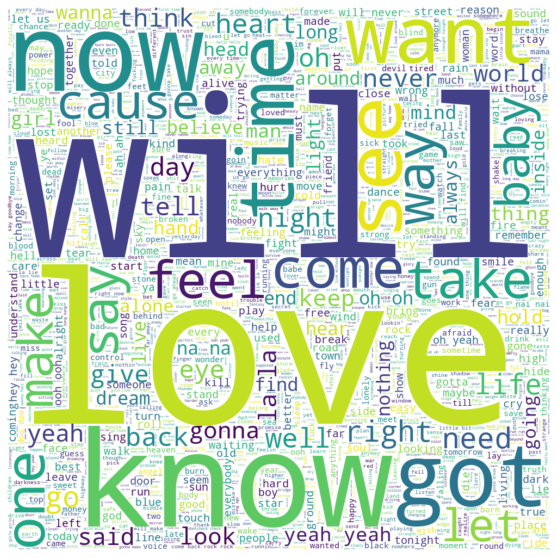

------------
Words visual for pop: 



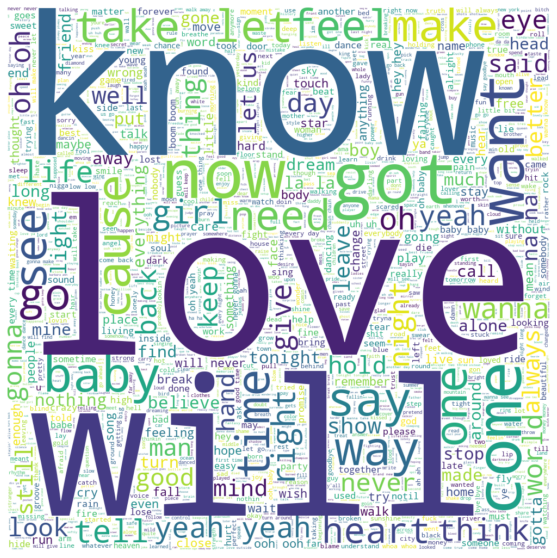

------------
Words visual for country: 



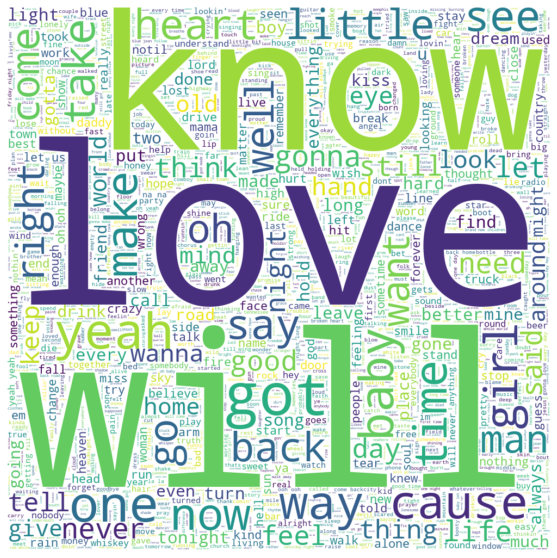

------------
Words visual for hiphop: 



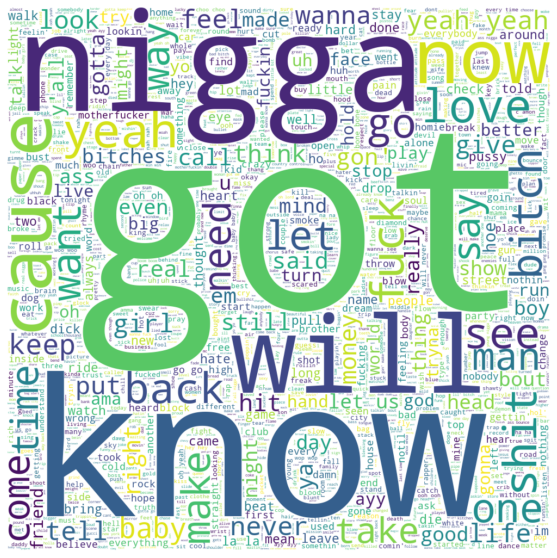

------------


In [12]:
genres = df.Genre.drop_duplicates().values.tolist()
print("Before Lemmataziation: '\n")
for genre in genres:
    print(f"Words visual for {genre}: \n")
    words = " ".join(df[df["Genre"] == genre]["Lyrics"])
    wc = WordCloud(background_color="white", max_words=2000, width=1000, height=1000)
    wc.generate(words)
    plt.figure(figsize=[10, 10])
    plt.imshow(wc, interpolation="bilinear")
    plt.axis('off')
    plt.savefig(f"./{genre}_cloud.png")
    plt.show()
    print("------------")


In [13]:
'''
As you can see, we got a LOT of common words so I'll add them to stopwords
so we can see the very different lyrics
such as: "see","one","say","love"
'''

'\nAs you can see, we got a LOT of common words so I\'ll add them to stopwords\nso we can see the very different lyrics\nsuch as: "see","one","say","love"\n'

After Lemataization: 

Words visual for rock: 



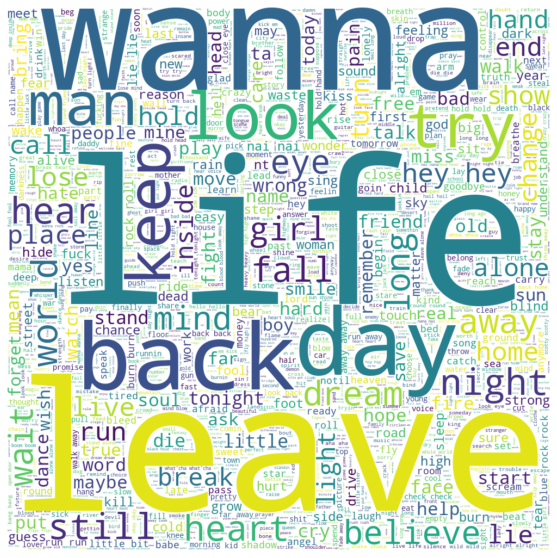

------------
Words visual for pop: 



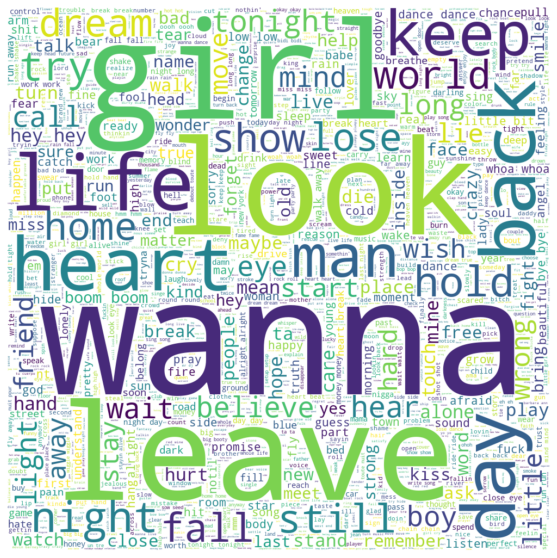

------------
Words visual for country: 



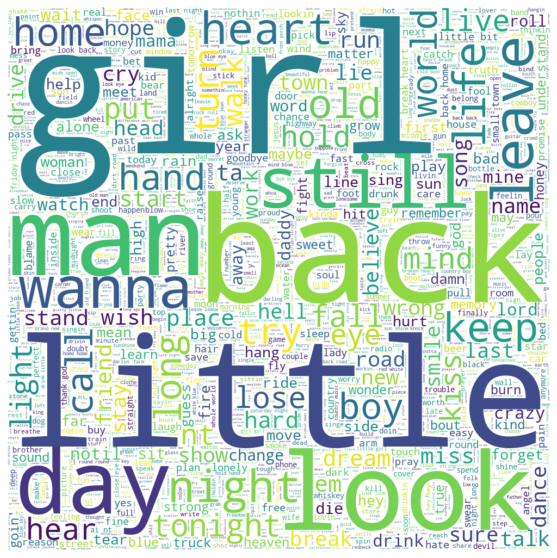

------------
Words visual for hiphop: 



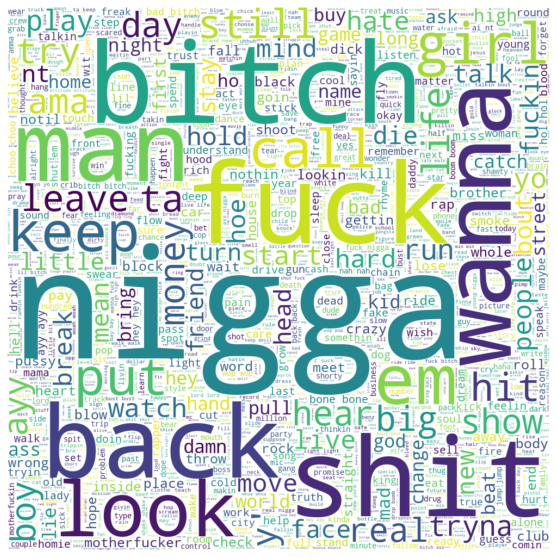

------------


In [14]:
print("After Lemataization: \n")
for genre in genres:
    print(f"Words visual for {genre}: \n")
    words = " ".join(df[df["Genre"] == genre]["Lem_Lyrics"])
    wc = WordCloud(background_color="white", stopwords=stopWords, max_words=2000, width=1000, height=1000)
    wc.generate(words)
    plt.figure(figsize=[10, 10])
    plt.imshow(wc, interpolation="bilinear")
    plt.axis('off')
    plt.savefig(f"./{genre}_cloud.png")
    plt.show()
    print("------------")

<AxesSubplot:>

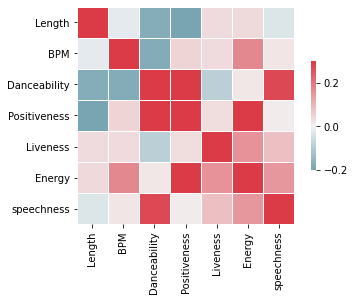

In [15]:

cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(df[['Length', 'BPM', 'Danceability', 'Positiveness', 'Liveness', 'Energy', 'speechness']].corr(), vmax=.3,
            center=0, cmap=cmap,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [16]:
pd.pivot_table(df, index=['Genre'], values=['Length', 'BPM', 'Danceability', 'Positiveness', 'Liveness', 'Energy',
                                            'speechness'])


,BPM,Danceability,Energy,Length,Liveness,Positiveness,speechness
Genre,,,,,,,
country,120.683638,57.886858,60.324630,3.324469,17.210618,55.044386,4.179721
hiphop,117.626884,73.189070,66.998116,3.597255,18.983668,52.016332,20.362437
pop,118.402648,59.995096,59.939186,3.650250,17.682688,54.816086,5.768024
rock,123.763774,51.767735,70.960029,3.984357,19.079222,52.556356,5.703637


In [17]:
df["Lyrics_Length"] = df.Lyrics.apply(lambda x: int(len(x.split(" "))))

<AxesSubplot:xlabel='Genre', ylabel='Lyrics_Length'>

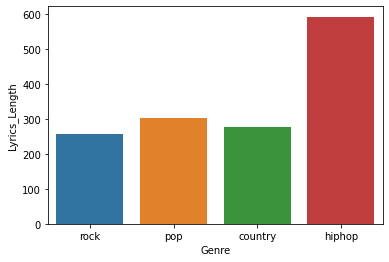

In [18]:
import numpy as np

# who v/s fare barplot
sns.barplot(x='Genre',
            y='Lyrics_Length',
            data=df,
            estimator=np.median,
            ci=0)

In [19]:
df.Artist = df.Artist.apply(lambda x: x.lower())

<AxesSubplot:xlabel='Genre'>

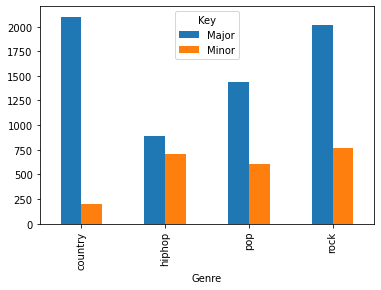

In [20]:
result = df.groupby(by=['Genre', 'Key']).size().reset_index()
result.rename(columns={0: "count"}, inplace=True)
# plot bar graph
result.set_index(["Genre", "Key"])['count'].unstack().plot.bar()

In [30]:
result = df.groupby(by=['Genre', 'Scale']).size().reset_index()
result.rename(columns={0: "count"}, inplace=True)
# plot bar graph
pd.pivot_table(result,index=['Genre','Scale'],values='count')

count
Genre   Scale       
country A        269
        A#       135
        B        154
        C        257
        C#       127
        D        296
        D#        82
        E        228
        F        184
        F#       132
        G        300
        G#       134
hiphop  A         94
        A#       132
        B        153
        C        129
        C#       327
        D        125
        D#        18
        E         79
        F        114
        F#       133
        G        156
        G#       132
pop     A        220
        A#       138
        B        177
        C        244
        C#       163
        D        192
        D#        72
        E        164
        F        180
        F#       131
        G        212
        G#       146
rock    A        381
        A#       122
        B        202
        C        317
        C#       200
        D        379
        D#        77
        E        280
        F        189
        F#       145
        G        347
        G#       138

In [21]:
"""
find the longest row of each song:
in the not formatted lyrics, each line ends with \r\n.
"""
def longest_line(lyrics):
    max=0
    for line in lyrics.split("\r\n"):
        max = len(line) if len(line) > max else max
    return max
df["Longest_Line"] = df["Not_Formatted_Lyrics"].apply(lambda x: longest_line(x))
df.head()

,Genre,Title,Artist,Explicit,Length,Scale,Key,BPM,Danceability,Positiveness,Liveness,Energy,speechness,KeyScaled,Lyrics,Not_Formatted_Lyrics,Lem_Lyrics,Lyrics_Length,Longest_Line
0,rock,into the storm,gojira,False,5.02,D,Major,106,25,11,13,97,7,D,go say something about awakening the rebellion...,Go\r\n\r\nSay something about awakening\r\nThe...,awaken rebellion wake change course law follow...,173,47
1,rock,the sound of silence,disturbed,False,4.08,F#,Minor,86,32,18,10,28,3,F#m,hello darkness my old friend i have come to ta...,"Hello darkness, my old friend\r\nI've come to ...",hello darkness old friend I talk vision softly...,218,97
2,rock,amazonia,gojira,False,5.00,A,Major,182,38,51,24,95,4,A,incite a riot put yourself in a trance you rot...,"Incite a riot, put yourself in a trance\r\nYou...",incite riot put trance rotate frame world rely...,154,48
3,rock,back in black,ac/dc,False,4.15,A,Major,188,31,76,8,70,5,A,back in black i hit the sack i have been too l...,"Back in black, I hit the sack\r\nI've been too...",back black I hit sack I long I glad back yes I...,307,55
4,rock,another world,gojira,False,4.24,G,Minor,170,35,24,12,88,4,Gm,we mock and slaughter all the purest kinds bli...,We mock and slaughter all the purest kinds\r\n...,mock slaughter pure kind blind noise maze flas...,95,53


In [22]:
"""
Song length per words
"""
df["Length_Words_Ratio"]=df.Lyrics_Length/df.Length
df.head()

,Genre,Title,Artist,Explicit,Length,Scale,Key,BPM,Danceability,Positiveness,Liveness,Energy,speechness,KeyScaled,Lyrics,Not_Formatted_Lyrics,Lem_Lyrics,Lyrics_Length,Longest_Line,Length_Words_Ratio
0,rock,into the storm,gojira,False,5.02,D,Major,106,25,11,13,97,7,D,go say something about awakening the rebellion...,Go\r\n\r\nSay something about awakening\r\nThe...,awaken rebellion wake change course law follow...,173,47,34.462151
1,rock,the sound of silence,disturbed,False,4.08,F#,Minor,86,32,18,10,28,3,F#m,hello darkness my old friend i have come to ta...,"Hello darkness, my old friend\r\nI've come to ...",hello darkness old friend I talk vision softly...,218,97,53.431373
2,rock,amazonia,gojira,False,5.00,A,Major,182,38,51,24,95,4,A,incite a riot put yourself in a trance you rot...,"Incite a riot, put yourself in a trance\r\nYou...",incite riot put trance rotate frame world rely...,154,48,30.800000
3,rock,back in black,ac/dc,False,4.15,A,Major,188,31,76,8,70,5,A,back in black i hit the sack i have been too l...,"Back in black, I hit the sack\r\nI've been too...",back black I hit sack I long I glad back yes I...,307,55,73.975904
4,rock,another world,gojira,False,4.24,G,Minor,170,35,24,12,88,4,Gm,we mock and slaughter all the purest kinds bli...,We mock and slaughter all the purest kinds\r\n...,mock slaughter pure kind blind noise maze flas...,95,53,22.405660


In [23]:
df.to_csv("final.csv")
